# PHASE 3 PROJECT

## Introduction

This project focusses on Machine learning mainly a classification problem. The dataset choosen is SyriaTel customer churn dataset

## Business Understanding.

The problem statement for SyriaTel's customer churn dataset addresses a critical challenge faced by the telecommunications industry: predicting customer retention. As a binary classification problem, the goal is to determine whether a customer is likely to discontinue their business with SyriaTel in the near future. This prediction is crucial for mitigating financial losses associated with customer attrition.

## Data Understanding.

In the dataset selected; SyriaTel customer churn, contains data collected from the telecommunications company SyriaTel and entails 21 columns and 3,332 the following columns:

1. State - contains data indicating the state customer is from.
2. Account length - duration of ownership of account.
3. phone number
4. area code
5. inter national plan
6. voicemail plan
7. number vmail messages - amount of voice mail messages
8. Total day minutes, calls, charges - 3 different columns
9. Total eve minutes, calls, charges - 3 different columns - eve stands for evening
10. Total night minutes, calls, charges - 3 different columns
11. Total intl minutes, calls, charges - 3 different columns - intl stands for international
12. Customer service calls
13. Churn - this will be the target variable.

## Main objective

The main objective is to create a classification model to predict whether a customer will soon stop doing business with the telecommunications company.

### Other objectives

1. To determine most important features for model.
2. Evaluate and optimize model performance.

In [264]:
# importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind, mannwhitneyu
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [265]:
# loading the dataset
df = pd.read_csv('bigml_59c28831336c6604c800002a.csv')

### Analysing Data and Cleaning

In [266]:
df.head() # Checking first 5 rows.

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [267]:
df.tail() # Last 5 rows.

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False
3332,TN,74,415,400-4344,no,yes,25,234.4,113,39.85,...,82,22.60,241.4,77,10.86,13.7,4,3.70,0,False


In [268]:
df.describe() # getting statistic summary

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [269]:
df.info()# checking null and data type for each column to determine which needs to be converted.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [270]:
df['state'].unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [271]:
df['state'].isnull().sum()

0

In [272]:
df['area code'].isnull().sum()

0

In [273]:
df['phone number'].isnull().sum()

0

In [274]:
df.isnull()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3329,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3330,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3331,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [275]:
df.isnull().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [276]:
df['phone number'].duplicated().sum()

0

In [277]:
df['state'].duplicated().sum()

3282

In [278]:
df['churn'].value_counts()

churn
False    2850
True      483
Name: count, dtype: int64

Using Chi-square test to determine which geographical column to drop due to its ability to handle categorical data and test for associations between categorical variables.
Null hypothesis; There is no association btween state/areacode and churn.
alternate Hypothesis; there is an association

It provides a straightforward method to test if churn rates differ across categories of state and area code.


In [279]:
# Creating a contingency table for 'state' and 'churn'
contingency_state = pd.crosstab(df['state'], df['churn'])

# Performing the Chi-Square Test
chi2_stat, p_value, dof, ex = chi2_contingency(contingency_state)

print("Chi-Square Statistic:", chi2_stat)
print("P-Value:", p_value)

# printing
if p_value < 0.05:
    print("There is a significant association between 'state' and churn.")
else:
    print("There is no significant association between 'state' and churn.")

Chi-Square Statistic: 83.04379191019663
P-Value: 0.002296221552011188
There is a significant association between 'state' and churn.


In [280]:
# Creating a contingency table for 'area code' and 'churn'
contingency_area_code = pd.crosstab(df['area code'], df['churn'])

# Performing the Chi-Square Test
chi2_stat, p_value, dof, ex = chi2_contingency(contingency_area_code)

print("Chi-Square Statistic:", chi2_stat)
print("P-Value:", p_value)

# printing
if p_value < 0.05:
    print("There is a significant association between 'area code' and churn.")
else:
    print("There is no significant association between 'area code' and churn.")

Chi-Square Statistic: 0.17754069117425395
P-Value: 0.9150556960243712
There is no significant association between 'area code' and churn.


Area code is dropped since it has no significant association to churn.

In [281]:
df.drop('area code', axis=1, inplace = True)

In [282]:
# Dropping phone number since it will not be useful for predictive modelling.
df.drop('phone number', axis=1, inplace = True)

Converting columns

In [283]:
# converting iternational plan and voicemail plan from ctegorical to numeric variables by mapping yes to 1 and no to 0.
df['international plan'] = df['international plan'].map({'yes': 1, 'no': 0})
df['voice mail plan'] = df['voice mail plan'].map({'yes': 1, 'no': 0})

In [284]:
df.head()

,state,account length,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


### EDA

In [313]:
### Univariate Analysis

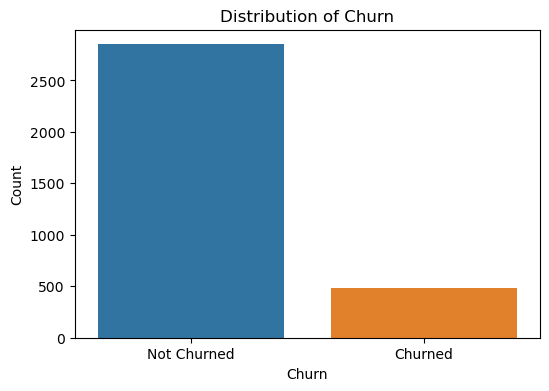

In [285]:
# Bar plot showing balance between churned and non-churned 
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='churn')
plt.title('Distribution of Churn')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Not Churned', 'Churned'])
plt.show()

The above graph shows an imbalance distribution

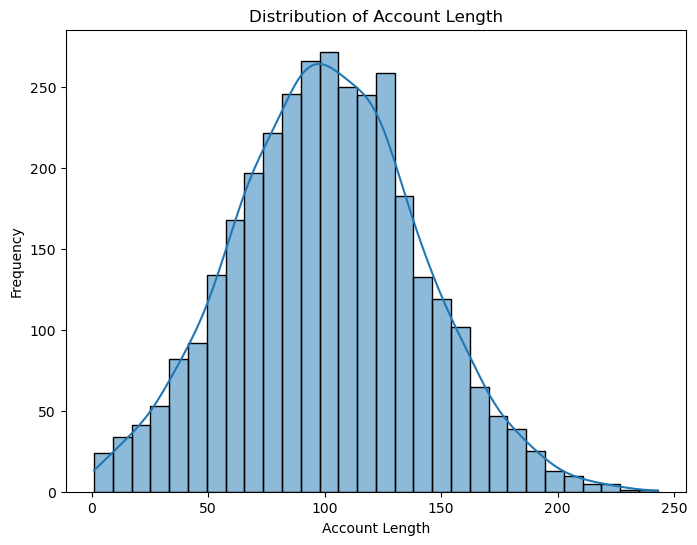

In [286]:
# Histogram to see distribution of account lengths
plt.figure(figsize=(8, 6))
sns.histplot(df['account length'], bins=30, kde=True)
plt.title('Distribution of Account Length')
plt.xlabel('Account Length')
plt.ylabel('Frequency')
plt.show()

### Bivariate Analysis

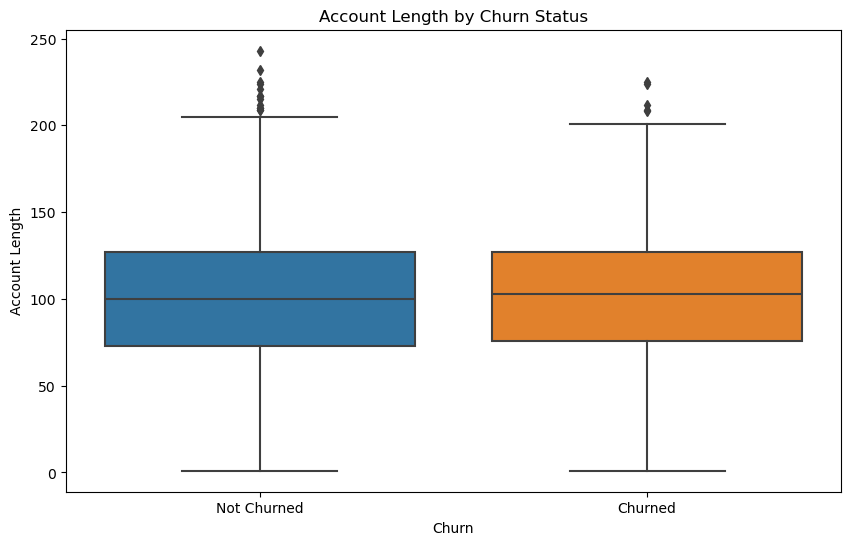

In [287]:
# Boxplot to see how account length varies between churned and non-churned customers.
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='churn', y='account length')
plt.title('Account Length by Churn Status')
plt.xlabel('Churn')
plt.ylabel('Account Length')
plt.xticks(ticks=[0, 1], labels=['Not Churned', 'Churned'])
plt.show()

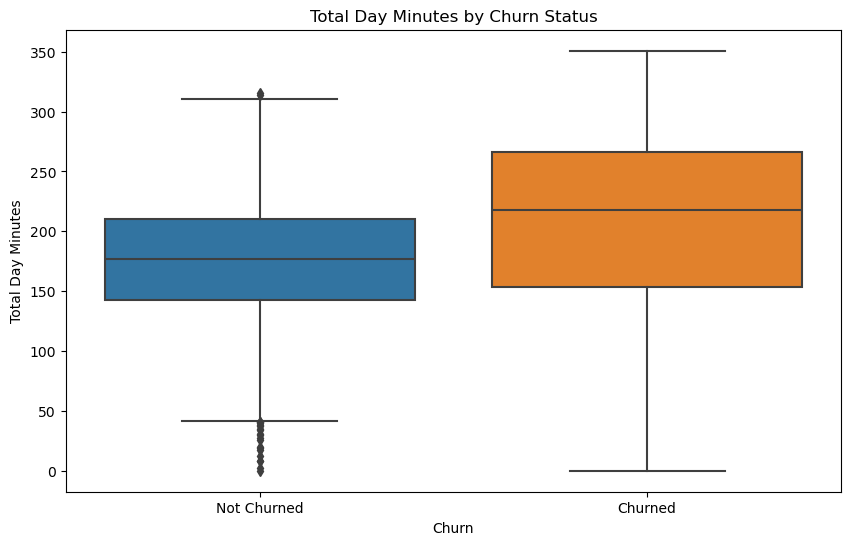

In [288]:
# Boxplot to see how many minutes per day differs between curned and non_churned.
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='churn', y='total day minutes')
plt.title('Total Day Minutes by Churn Status')
plt.xlabel('Churn')
plt.ylabel('Total Day Minutes')
plt.xticks(ticks=[0, 1], labels=['Not Churned', 'Churned'])
plt.show()

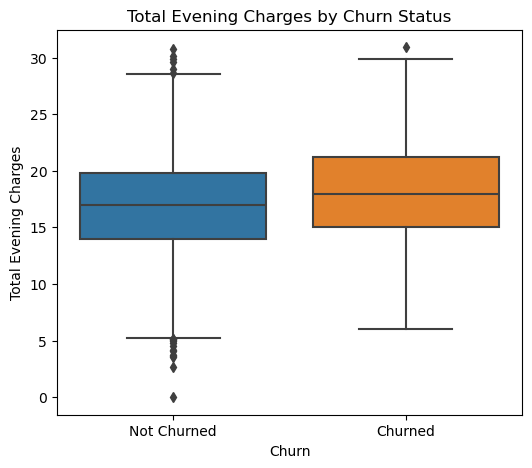

In [312]:
# boxplot to visualize how evening charges vary with churn.
plt.figure(figsize=(6, 5))
sns.boxplot(data=df, x='churn', y='total eve charge')
plt.title('Total Evening Charges by Churn Status')
plt.xlabel('Churn')
plt.ylabel('Total Evening Charges')
plt.xticks(ticks=[0, 1], labels=['Not Churned', 'Churned'])
plt.show()

### Multivariate Aanalysis

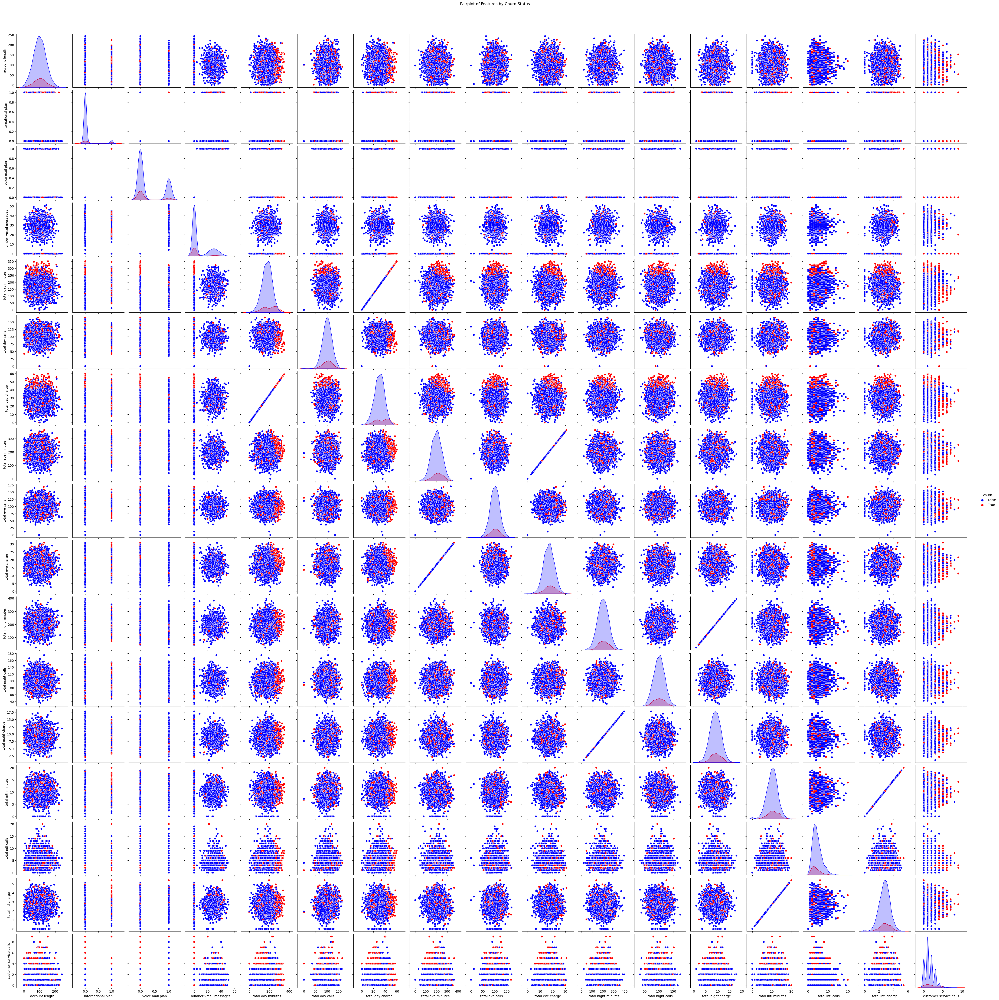

In [292]:
sns.pairplot(df, hue='churn', palette={0: 'blue', 1: 'red'}, diag_kind='kde')
plt.suptitle('Pairplot of Features by Churn Status', y=1.02)
plt.show()

### Statistics

In [293]:
numerical_features = ['account length', 'number vmail messages', 'total day minutes', 'total day calls', 
                       'total day charge', 'total eve minutes', 'total eve calls', 
                       'total eve charge', 'total night minutes', 'total night calls', 
                       'total night charge', 'total intl calls', 'total intl charge', 
                       'customer service calls']

To compare statistics for churned and non-churned customers.

To identify how numerical features correlate with the churn outcome.

In [294]:

correlations = df[numerical_features + ['churn']].corr()['churn']
print(correlations)

account length            0.016541
number vmail messages    -0.089728
total day minutes         0.205151
total day calls           0.018459
total day charge          0.205151
total eve minutes         0.092796
total eve calls           0.009233
total eve charge          0.092786
total night minutes       0.035493
total night calls         0.006141
total night charge        0.035496
total intl calls         -0.052844
total intl charge         0.068259
customer service calls    0.208750
churn                     1.000000
Name: churn, dtype: float64


To test whether the mean values of numerical features are significantly different between churned and non-churned customers.


In [295]:
# Performing t-tests for numerical features
for feature in numerical_features:
    churned = df[df['churn'] == 1][feature]
    not_churned = df[df['churn'] == 0][feature]
    stat, p_value = ttest_ind(churned, not_churned, nan_policy='omit')
    print(f"T-Test for {feature}: p-value = {p_value}")

T-Test for account length: p-value = 0.3397600070563822
T-Test for number vmail messages: p-value = 2.1175218402712026e-07
T-Test for total day minutes: p-value = 5.300278227492294e-33
T-Test for total day calls: p-value = 0.28670102402430314
T-Test for total day charge: p-value = 5.300605952408437e-33
T-Test for total eve minutes: p-value = 8.011338561286236e-08
T-Test for total eve calls: p-value = 0.5941305829776864
T-Test for total eve charge: p-value = 8.036524227774755e-08
T-Test for total night minutes: p-value = 0.040466484637911374
T-Test for total night calls: p-value = 0.723027787216009
T-Test for total night charge: p-value = 0.04045121876905209
T-Test for total intl calls: p-value = 0.0022747014098501183
T-Test for total intl charge: p-value = 8.01875358306812e-05
T-Test for customer service calls: p-value = 3.900360240189117e-34


### One-hot encoding

In [296]:
# confirming categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns
print(categorical_columns)

Index([], dtype='object')


In [297]:
# One_hot encoding state.
df_encoded = pd.get_dummies(df, columns=['state'], drop_first=False)

In [298]:
# label encoding international plan and voice mail plan.
label_encoder_international_plan = LabelEncoder()
label_encoder_voice_mail_plan = LabelEncoder()

# label encoding
df_encoded['international plan'] = label_encoder_international_plan.fit_transform(df['international plan'])
df_encoded['voice mail plan'] = label_encoder_voice_mail_plan.fit_transform(df['voice mail plan'])

### Dealing with imbalance

Combination of smote and undersampling

In [299]:
# df_encoded is the DataFrame in use and 'churn' is the target variable
X = df_encoded.drop(columns=['churn'])  # Features
y = df_encoded['churn']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

print(f"Training set size: {X_train.shape[0]}")
print(f"Testing set size: {X_test.shape[0]}")

Training set size: 2333
Testing set size: 1000


In [300]:
# resampling strategies
over = SMOTE(random_state=42)
under = RandomUnderSampler(random_state=42)

# Creating a pipeline that first applies SMOTE and then RandomUnderSampler
pipeline = Pipeline(steps=[('o', over), ('u', under)])

# Fit and resample the training data
X_train_resampled, y_train_resampled = pipeline.fit_resample(X_train, y_train)

print(f"Resampled training set size: {X_train_resampled.shape[0]}")

Resampled training set size: 3990


### Validating resampling impact

Class distribution in resampled training data:
churn
False    1995
True     1995
Name: count, dtype: int64


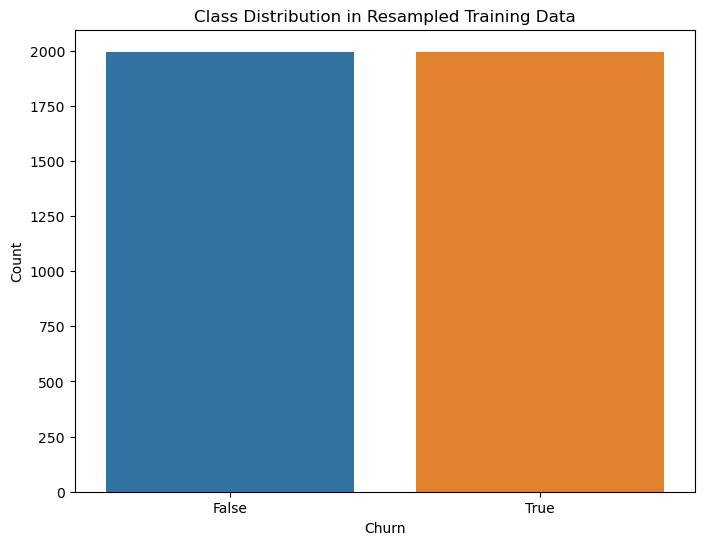

In [301]:
# Converting y_train_resampled to a DataFrame for easier manipulation
y_train_resampled_df = pd.DataFrame(y_train_resampled, columns=['churn'])

# Printing the value counts to see the class distribution
print("Class distribution in resampled training data:")
print(y_train_resampled_df['churn'].value_counts())

# Plotting the class distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='churn', data=y_train_resampled_df)
plt.title('Class Distribution in Resampled Training Data')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.show()

### Re-evaluating feature importance

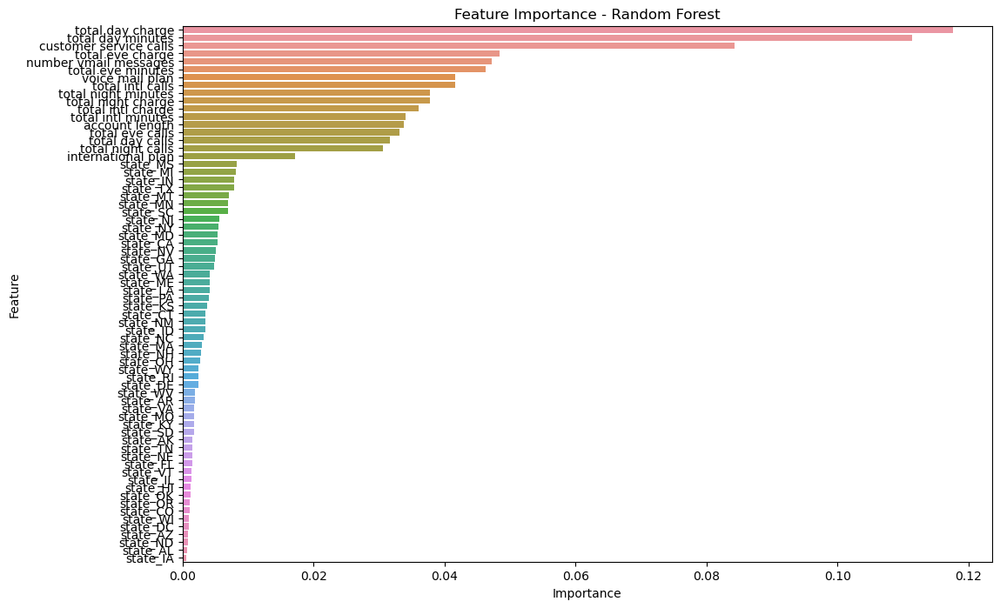

In [302]:

# Re-train the Random Forest Classifier on the resampled data
model_rf = RandomForestClassifier(random_state=42)
model_rf.fit(X_train_resampled, y_train_resampled)
# Extracting feature importances
def plot_feature_importance(model, X, title):
    feature_importances = model.feature_importances_
    features_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=features_df)
    plt.title(title)
    plt.show()

# Plotting feature importances for Random Forest
plot_feature_importance(model_rf, X_train_resampled, 'Feature Importance - Random Forest')

### Scaling 

In [304]:
# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the scaler on the training data
X_train_scaled = scaler.fit_transform(X_train_resampled)

# Transform the test data
X_test_scaled = scaler.transform(X_test)

In [305]:
# 
# Split the scaled data into training and testing sets
X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(X_train_scaled, y_train_resampled, test_size=0.3, random_state=42, stratify=y_train_resampled)

print(f"Training set size: {X_train_final.shape[0]}")
print(f"Testing set size: {X_test_final.shape[0]}")

Training set size: 2793
Testing set size: 1197


### Cross-validation

In [307]:
# Initialize the Logistic Regression model
model_logistic = LogisticRegression(random_state=42)

# Performing cross-validation
cv_scores_logistic = cross_val_score(model_logistic, X_train_final, y_train_final, cv=5, scoring='f1')
print(f"Logistic Regression Cross-Validation Scores: {cv_scores_logistic}")
print(f"Mean Cross-Validation Score: {cv_scores_logistic.mean()}")

# Initialize the Random Forest Classifier
model_rf = RandomForestClassifier(random_state=42)

# Performing cross-validation
cv_scores_rf = cross_val_score(model_rf, X_train_final, y_train_final, cv=5, scoring='f1')
print(f"Random Forest Cross-Validation Scores: {cv_scores_rf}")
print(f"Mean Cross-Validation Score: {cv_scores_rf.mean()}")

Logistic Regression Cross-Validation Scores: [0.90225564 0.90359168 0.90502793 0.92619926 0.91821561]
Mean Cross-Validation Score: 0.9110580259707636
Random Forest Cross-Validation Scores: [0.95081967 0.93577982 0.9352518  0.93478261 0.93989071]
Mean Cross-Validation Score: 0.9393049212568453


### logistic regression model

Logistic Regression is used as a baseline model due to its simplicity and interpretability. It is particularly well-suited for binary classification tasks where the goal is to predict the probability of a binary outcome such as for this project.

In [308]:
# Train Logistic Regression
model_logistic.fit(X_train_final, y_train_final)

# Making predictions
y_pred_logistic = model_logistic.predict(X_test_final)

# Evaluating the model
print("Logistic Regression Evaluation:")
print(confusion_matrix(y_test_final, y_pred_logistic))
print(classification_report(y_test_final, y_pred_logistic))

Logistic Regression Evaluation:
[[572  27]
 [ 71 527]]
              precision    recall  f1-score   support

       False       0.89      0.95      0.92       599
        True       0.95      0.88      0.91       598

    accuracy                           0.92      1197
   macro avg       0.92      0.92      0.92      1197
weighted avg       0.92      0.92      0.92      1197



As seen from the results above, from the Confusion matrix the instances model predicted correctly for both true negatives (572) and true positive (527) are much higher than when model predicted incorrectly false positive (27) and false negative (71).

The model seems to be performing well overall, with high precision, recall, and F1-scores for both classes. 

### Random Forest Classifier model

Random forest is used since it is robust to overfitting and handles complex data well. It builds multiple decision trees during training and aggregates their predictions, improving accuracy and stability.

In [309]:
# Train Random Forest Classifier
model_rf.fit(X_train_final, y_train_final)

# Making predictions
y_pred_rf = model_rf.predict(X_test_final)

# Evaluating the model
print("Random Forest Evaluation:")
print(confusion_matrix(y_test_final, y_pred_rf))
print(classification_report(y_test_final, y_pred_rf))

Random Forest Evaluation:
[[575  24]
 [ 39 559]]
              precision    recall  f1-score   support

       False       0.94      0.96      0.95       599
        True       0.96      0.93      0.95       598

    accuracy                           0.95      1197
   macro avg       0.95      0.95      0.95      1197
weighted avg       0.95      0.95      0.95      1197



The confusion matrix indicates that the instances model predicted correctly are significantly higher than the instances the model predicted incorrectly.

The model performs excellently with high precision, recall, and F1-scores for both classes and also it has an accuracy of 95% indicating that it is highly effective in classifying both False and True instances. F1-scores are equal for both classes indicating a balanced performance between precision and recall for both classes. Thus we can state that the model is working well and can handle both majority and minority classes effectively.

### Predictive Findings

The random forest model has an accuracy of 95% thus has strong predictive performance and both precision and recall are high.


From re-evaluating feature importance above, the top six features that are more important to model in the order of most important are 'total night charge', 'total day minutes', 'customer service calls', 'total eve charge', 'number vmail messages', 'total eve minutes' and 'voice mail plan'.

### Recommendations.

1. Priorities features indicated above as most important for predicting churn because this will help in allocation of resources accordinglly to prevent high churn rate in areas.
2. Strategies on how to boost international services of the company.
3. Continuously monitor momdel performance and update it to ensure model remains accurate and relevant.